Plot the source time function of the previous 1D case, how much is the speed of the wave?

[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\elastic-wave\source_time_function-1.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\elastic-wave\\source_time_function-1.gif")
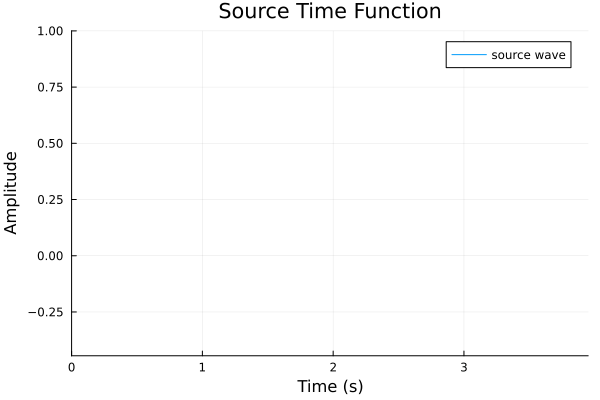

In [19]:
using Plots

# Parameters
t_max = 4.0    # Maximum simulation time (in seconds)
dt = 0.05    # Time step
nt = round(Int, t_max / dt) # Calculate the number of time steps based on t_max
f = 1.0      # central frequency of the source

# Time array
t = dt * (0:nt-1)

# Source term (simple Ricker wavelet)
function ricker_wavelet(t, f; tau=2.0)
    A = (1 - 2 * π^2 * f^2 * (t - tau)^2)
    wavelet = A * exp(-π^2 * f^2 * (t - tau)^2)
    return wavelet
end

# Compute source time function
source = ricker_wavelet.(t, f)

function plot_source_time_function(t, source, i)
    plot(t[1:i], source[1:i], title="Source Time Function", xlabel="Time (s)", ylabel="Amplitude", legend=true, label="source wave", xlims=(0, maximum(t)), ylims=(minimum(source), maximum(source)))
end

# Create animation
# @sync begin
    anim = @animate for i = 1:nt
        plot_source_time_function(t, source, i)
    end
# end

# Save animation as a gif
gif(anim, "source_time_function-1.gif", fps=15)

kecepatan c adalah akar kuadrat dari rasio modulus geser terhadap densitas massa

$$ c = \sqrt{\frac{\mu}{\rho}} $$

Optimize the computation and display on the figure

Based on the CFL (Courant-Friedrichs-Lewy) condition, the equation given by:

$$  c \frac{\Delta t}{\Delta x} \leq 1 $$

In this equation, $c$ represents the wave speed, $\Delta x$ represents the spatial step, and $\Delta t$ represents the time step. The condition states that the product of the wave speed and the ratio of the time step to the spatial step should be less than or equal to 1 to ensure numerical stability in certain numerical methods.

In [21]:
# Parameters
c = 850     # Speed of wave propagation (in m/s)
f = 1.0        # Central frequency of the source (in Hz)
λ = c / f      # Wavelength

# Adjust the spatial and temporal parameters to satisfy the CFL condition
dx = 0.01 * λ  # Spatial step size (about 1/10 of a wavelength)
dt = dx / c    # Time step size based on the CFL condition

t_max = 25.0    # Maximum simulation time (in seconds)
x_max = 5000.0    # Maximum spatial coordinate (in meters)

println("Spatial step size: $dx")
println("Time step size: $dt")

nt = round(Int, t_max / dt) # Calculate the number of time steps based on t_max
nx = round(Int, x_max / dx) # Calculate the number of spatial steps based on x_max
println("Number of time steps: $nt")
println("Number of spatial steps: $nx")

ρ = 2.5        # Density of the medium (in kg/m^3)
μ = ρ * c^2    # Shear modulus of the medium (in Pa)

u = zeros(nx)       # Displacement at current time step
u_prev = zeros(nx)  # Displacement at the previous time step
u_next = zeros(nx)  # Displacement at the next time step

u_time = zeros(nt, nx)  # Displacement at all time steps

# Source term (simple Ricker wavelet)
function ricker_wavelet(t, f; tau=2.0)
    A = (1 - 2 * π^2 * f^2 * (t - tau)^2)
    wavelet = A * exp(-π^2 * f^2 * (t - tau)^2)
    return wavelet
end

source_loc = nx ÷ 2

# Time-stepping loop
for it = 1:nt
    for ix = 2:nx-1
        u_next[ix] = 2u[ix] - u_prev[ix] + (c^2 * dt^2 / dx^2) * (u[ix+1] - 2u[ix] + u[ix-1])
    end
    u_next[source_loc] += ricker_wavelet(it * dt, f)

    u_prev, u, u_next = u, u_next, u_prev

    u_time[it, :] = u
end

Spatial step size: 8.5
Time step size: 0.01
Number of time steps: 2500
Number of spatial steps: 588


[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\elastic-wave\elastic_wave-1.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\elastic-wave\\elastic_wave-1.gif")
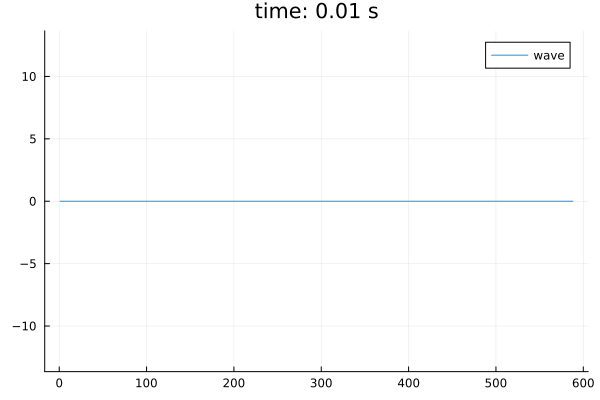

In [22]:
using Plots

max_u = maximum(u_time)
min_u = minimum(u_time)

anim = @animate for it = 1:nt
    plot(u_time[it, :], legend=true, title="time: $(it*dt) s", label="wave", ylims=(min_u, max_u))
end

gif(anim, "elastic_wave-1.gif", fps=20)

Discritize the wave equation in 2D and implement it in Julia!

In [9]:
# Parameters
c = 850     # Speed of wave propagation (in m/s)
f = 1.0     # Central frequency of the source (in Hz)
λ = c / f   # Wavelength

# Adjust the spatial and temporal parameters to satisfy the CFL condition
dx = 0.01 * λ  # Spatial step size (about 1/10 of a wavelength)
dt = dx / c    # Time step size based on the CFL condition

println("Spatial step size: $dx")
println("Time step size: $dt")

t_max = 10.0    # Maximum simulation time (in seconds)
x_max = 1000.0  # Maximum spatial coordinate (in meters)
y_max = 1000.0  # Maximum spatial coordinate (in meters)

nt = round(Int, t_max / dt) # Calculate the number of time steps based on t_max
nx = round(Int, x_max / dx) # Calculate the number of spatial steps based on x_max
ny = round(Int, y_max / dx) # Calculate the number of spatial steps based on y_max

println("Number of time steps: $nt")
println("Number of spatial steps: $nx")

ρ = 2.5        # Density of the medium (in kg/m^3)
μ = ρ * c^2    # Shear modulus of the medium (in Pa)

u = zeros(nx, ny)       # Displacement at current time step
u_prev = zeros(nx, ny)  # Displacement at the previous time step
u_next = zeros(nx, ny)  # Displacement at the next time step

u_time = zeros(nt, nx, ny)  # Displacement at all time steps

# Source term (simple Ricker wavelet)
function ricker_wavelet(t, f; tau=2.0)
    A = (1 - 2 * π^2 * f^2 * (t - tau)^2)
    wavelet = A * exp(-π^2 * f^2 * (t - tau)^2)
    return wavelet
end

source_loc_x = nx ÷ 2
source_loc_y = ny ÷ 2

# Time-stepping loop
for it = 1:nt
    for ix = 2:nx-1
        for iy = 2:ny-1
            u_next[ix, iy] = 2u[ix, iy] - u_prev[ix, iy] + (c^2 * dt^2 / dx^2) * (u[ix+1, iy] + u[ix-1, iy] + u[ix, iy+1] + u[ix, iy-1] - 4u[ix, iy])

            if u_next[ix, iy] > 1e10
                println("$(u_next[ix,iy]) at $(ix), $(iy)")
                break
                
            end
        end
    end

    u_prev, u, u_next = u, u_next, u_prev

    u_time[it, :, :] = u
end

Spatial step size: 8.5
Time step size: 0.01
Number of time steps: 1000
Number of spatial steps: 118
1.1548445065426064e10 at 54, 59
1.148305133980272e10 at 55, 56
1.148305133980272e10 at 56, 55
1.829474795826494e10 at 57, 56
1.5699740533346842e10 at 58, 55
1.1548445065426064e10 at 59, 54
1.5699740533346842e10 at 60, 55
1.829474795826494e10 at 61, 56
1.148305133980272e10 at 62, 55
1.148305133980272e10 at 63, 56
1.1548445065426064e10 at 64, 59
1.3240124813261217e10 at 51, 57
1.018422216979122e10 at 52, 54
1.0952727821483261e10 at 53, 53
1.0184222169791216e10 at 54, 52
2.3887721538846756e10 at 55, 53
1.9158288384842197e10 at 56, 52
1.3240124813261215e10 at 57, 51
2.625898689061399e10 at 58, 52
1.5539600464056286e10 at 59, 51
2.625898689061399e10 at 60, 52
1.3240124813261215e10 at 61, 51
1.9158288384842197e10 at 62, 52
2.3887721538846756e10 at 63, 53
1.0184222169791216e10 at 64, 52
1.0952727821483261e10 at 65, 53
1.018422216979122e10 at 66, 54
1.3240124813261217e10 at 67, 57
1.154085348698

Excessive output truncated after 524314 bytes.


6.279573513991076e80 at 23, 2
4.2421746861594794e80 at 24, 3
1.4425321964773223e81 at 25, 2
9.490438721095636e80 at 26, 3
3.1443423671481116e81 at 27, 2
2.0151754637018482e81 at 28, 3
6.507006399440426e81 at 29, 2
4.0636852258292355e81 at 30, 3
1.2792155040653454e82 at 31, 2
7.787234353464063e81 at 32, 3
2.3905754883413924e82 at 33, 2
1.4190453022236392e82 at 34, 3
4.249699886046351e82 at 35, 2
2.4607377418696515e82 at 36, 3
7.19152488670578e82 at 37, 2
4.063518176041154e82 at 38, 3
1.1593176616530628e83 at 39, 2
6.394650380336638e82 at 40, 3
1.7815946789041334e83 at 41, 2
9.59643011860961e82 at 42, 3
2.611762197541653e83 at 43, 2
1.3742475232945747e83 at 44, 3
3.6546859723143376e83 at 45, 2
1.8790732167095886e83 at 46, 3
4.884340651368867e83 at 47, 2
2.4545896958817683e83 at 48, 3
6.237618333096391e83 at 49, 2
3.064585151691227e83 at 50, 3
7.615054203183828e83 at 51, 2
3.658382867407265e83 at 52, 3
8.890339722581045e83 at 53, 2
4.176991846288163e83 at 54, 3
9.928187384663615e83 at 55

In [7]:
println("Maximum displacement: $(maximum(u_time))")
println("Minimum displacement: $(minimum(u_time))")
# print(u_time[1, 100, :])

Maximum displacement: NaN
Minimum displacement: NaN


In [6]:
using Plots

max_u = maximum(u_time)
min_u = minimum(u_time)

x = range(0, stop=x_max, length=nx)
y = range(0, stop=y_max, length=ny)

anim = @animate for it = 1:nt
    heatmap(x, y, u_time[it, :, :], color=:viridis, clim=(min_u, max_u), title="time: $(it*dt) s")
end

gif(anim, "elastic_wave-2D.gif", fps=20)

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\faliq\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\faliq\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191


LoadError: MethodError: no method matching isless(::Nothing, ::Int64)

[0mClosest candidates are:
[0m  isless([91m::Union{StatsBase.PValue, StatsBase.TestStat}[39m, ::Real)
[0m[90m   @[39m [32mStatsBase[39m [90mC:\Users\faliq\.julia\packages\StatsBase\WLz8A\src\[39m[90m[4mstatmodels.jl:90[24m[39m
[0m  isless([91m::AbstractFloat[39m, ::Real)
[0m[90m   @[39m [90mBase[39m [90m[4moperators.jl:179[24m[39m
[0m  isless([91m::Real[39m, ::Real)
[0m[90m   @[39m [90mBase[39m [90m[4moperators.jl:421[24m[39m
[0m  ...
